# Object Detection in Dark Images

## Business problem

Object Detection has attracted the much research attention due to its
close relationship with image understanding and video analysis, Also
the resent advancements in Self-Driving cars, Autonomous vehicle
detection and counting systems. 

Object Detection with Deep Learning techniques has some
challenges in detecting the objects in the images with extremely low
light. The low light conditions can emerge depending on time of the
day and availability of light sources. The impact of these image
variations on the state of the art algorithms can be evaluated by
checking their performances on this kind of datasets/images.

### Problem Statement

Our task here is to evaluate the state of the art algorithm like YOLO v3 performance on Exclusive Dark Image Dataset.

## Deep Learning Problem 

### Dataset Overview

- The Dataset used is 'Exclusively Dark Image Dataset'.
- The Dataset can be downloaded from here - https://github.com/cs-chan/Exclusively-Dark-Image-Dataset
- The ExDARK is a low-light object image dataset, where an image is categorized as low-light if it has either low or significant variations in illumination. 
- The dataset currently has 7363 images with 12 object classes namely Bicycle, Boat, Bottle, Bus, Car, Cat, Chair, Cup, Dog, Motorbike, People, and Table.
- Also these images are from 10 types of low-light conditions like:
  Low, Ambient, Object, Single, Weak, Strong, Window, Screen, Shadow, Twilight. 
- Provided dataset is categorized in object level and also the bounding boxes annotations are included. 

## Exploratory Data Analysis

In [ ]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import image
import cv2
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm

In [ ]:
root_dir = 'ExDark'

In [ ]:
annotations_file = root_dir+'/Annotations/imageclasslist.txt'
readme = root_dir+'/ReadMe.txt'
with open(readme, 'r') as f: # readme file 
    print(f.read())

The Exclusively Dark Dataset

Details
The Exclusively Dark (ExDark) Dataset consists of object images captured in low-light conditions collected from various sources. Containing 7,363 images, all of which are annotated with 12 object classes using bounding box and as image class. Additionally, the images are annotated with 10 lighting types. This is a challenging dataset as it contains only low-light images of varying environments and complexity.

There are two(2) folders associated with the dataset and a ReadMe file:
1. Dataset
	- Consisting 12 folders holding the low-light images, labeled with the image classes
2. Annotation
	- Contains 12 folders holding the bounding box annotation txt file for each image in the dataset
	- imageclasslist.txt contains the list of image names, image class, lighting type, indoor/outdoor, and the train/validation/test set annotations.
	- The data is separated into 3,000 images as the training set (250 image/class), 1,800 images as the validation set (15

In [ ]:
#creating dictionaries for further usage for different conditions mentioned above

light_dic = {1:'Low',2: 'Ambient',3:'Object',4:'Single',5:'Weak',6:'Strong',7:'Screen',8:'Window',9:'Shadow',10:'Twilight'}
class_dic = {1:'Bicycle',2:'Boat',3:'Bottle',4:'Bus',5:'Car',6:'Cat',7:'Chair',8:'Cup',9:'Dog',10:'Motorbike',11:'People',12:'Table'}
in_out_dic = {1:'Indoor',2:'outdoor'}
train_val_test = {1:'train',2:'val',3:'test'}

In [ ]:
#creating the .csv file from the data given in annotations text file

file_path =[]
labels =[]
lightings = []
indoor_outdoor =[]
train_val_test =[]

with open(annotations_file,'r') as f:
    for i,line in enumerate(f):
        if i==0:
            continue
        label = int(line.split()[1])
        light = int(line.split()[2])
        in_out = int(line.split()[3])
        dataset = int(line.split()[4])
        
        path = root_dir+'/Dataset/'+class_dic[label]+'/'+line.split()[0]
        file_path.append(path)
        labels.append(label)
        lightings.append(light)
        indoor_outdoor.append(in_out)
        train_val_test.append(dataset)
        

In [ ]:
df = {'path':file_path, 'classes':labels, 'light':lightings, 'indoor_outdoor':indoor_outdoor,'train_val_test':train_val_test}
data = pd.DataFrame(df)

In [ ]:
print('Dataset shape:',data.shape)
data.head()

Dataset shape: (7363, 5)


,path,classes,light,indoor_outdoor,train_val_test
0,ExDark/Dataset/Bicycle/2015_00001.png,1,2,1,1
1,ExDark/Dataset/Bicycle/2015_00002.png,1,6,2,1
2,ExDark/Dataset/Bicycle/2015_00003.png,1,5,2,1
3,ExDark/Dataset/Bicycle/2015_00004.jpg,1,3,2,1
4,ExDark/Dataset/Bicycle/2015_00005.jpg,1,6,2,1


In [ ]:
data.to_csv('processed_data.csv',index=False)

### Analysis and visualization

In [ ]:
def get_class_analysis(label):
    
    df = data[data['classes']==label]
    
    in_out = dict(df['indoor_outdoor'].value_counts())
    
    light_cond = dict(df['light'].value_counts())
    
    print('The '+class_dic[label] + ' data shape is', df.shape)
    
    in_out_label =[]
    in_out_cnt =[]
    for i,j in in_out.items():
        in_out_label.append(in_out_dic[i])
        in_out_cnt.append(j)
    
    light_label =[]
    light_cnt =[]
    for i,j in light_cond.items():
        light_label.append(light_dic[i])
        light_cnt.append(j)
    
    
    f,ax = plt.subplots(2,1,figsize=(16,8))
    ax1= sns.barplot(x=in_out_label,y=in_out_cnt,ax=ax[0])
    ax1.set_title('Indoor/outdoor Disb')
    ax2= sns.barplot(x=light_label,y=light_cnt,ax=ax[1])
    ax2.set_title('Lighting conditions Disb')
    plt.show()
   

In [ ]:
def plot_sample_images(label,n):
    
    images =[]
    light =[]
    df = data[data['classes']==label]
    for i in range(1,11):
        temp = list(df[df['light']==i]['path'])[0:n]
        if len(temp)>2:
            for j in temp:
                light.append(i)
                images.append(j)
    
    print('Below are few of the '+class_dic[label] + ' images in different lighting conditions')

    fig, ax = plt.subplots(len(images)//n,n,figsize=(15,30),gridspec_kw={'wspace':0.01, 'hspace':0.1})
    ax = ax.ravel()
    
    for i,img in enumerate(images):

        im_org = cv2.imread(img)
        im_resized = cv2.resize(im_org, (300, 300), interpolation=cv2.INTER_LINEAR)
        ax[i].imshow(cv2.cvtColor(im_resized, cv2.COLOR_BGR2RGB),aspect="auto")
        ax[i].set_axis_off()  # corresponds to plt.subplot(x).axis('off')
        ax[i].set_xlim(ax[i].get_xlim())
        ax[i].set_ylim(ax[i].get_ylim())
        ax[i].set_title(light_dic[light[i]])


    plt.show()


<b> Object class Distribution

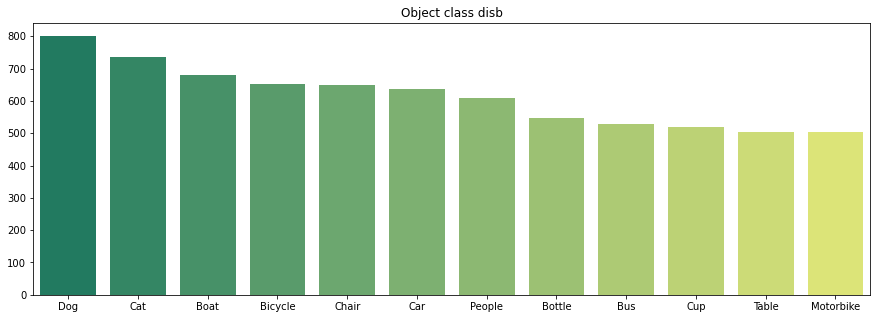

In [ ]:
class_labels = dict(data['classes'].value_counts())
labels =[]
count =[]
for i,j in class_labels.items():
    labels.append(class_dic[i])
    count.append(j)
plt.figure(figsize=(15,5))
sns.barplot(x=labels,y=count,palette='summer')
plt.title('Object class disb')
plt.show()
    

- The above plot is the count of different object classes available in the dataset. The count of each class is almost comparable.

<b> Analysis of few of the object classes along with visualization in different light conditions given

<b> Bicycle object Data Analysis

The Bicycle data shape is (652, 5)


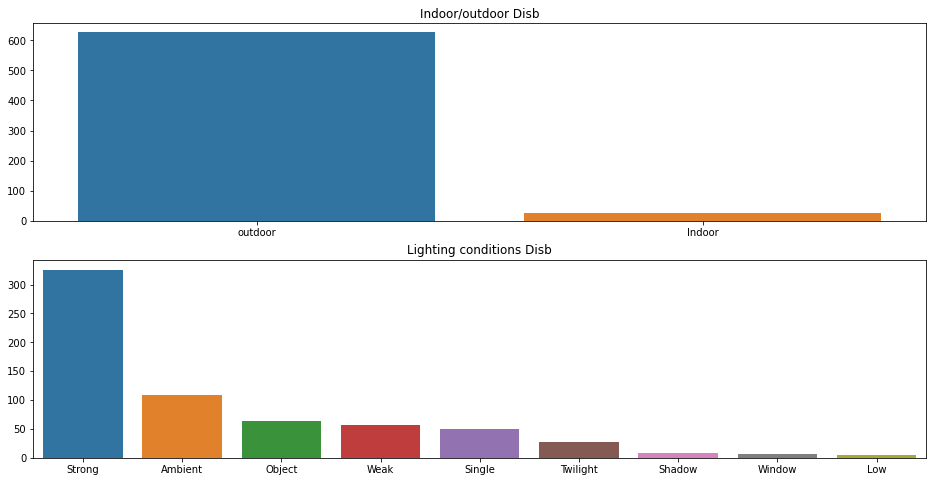

In [ ]:
get_class_analysis(1)

- There are 652 bicycle images.
- The images are from 10 different lightning conditions. Among them we see more images from 'strong' & 'ambient' conditions and very few from 'low', 'shadow', & 'window' conditions
- Also majority images are captured in outdoor.

Below are few of the Bicycle images in different lighting conditions


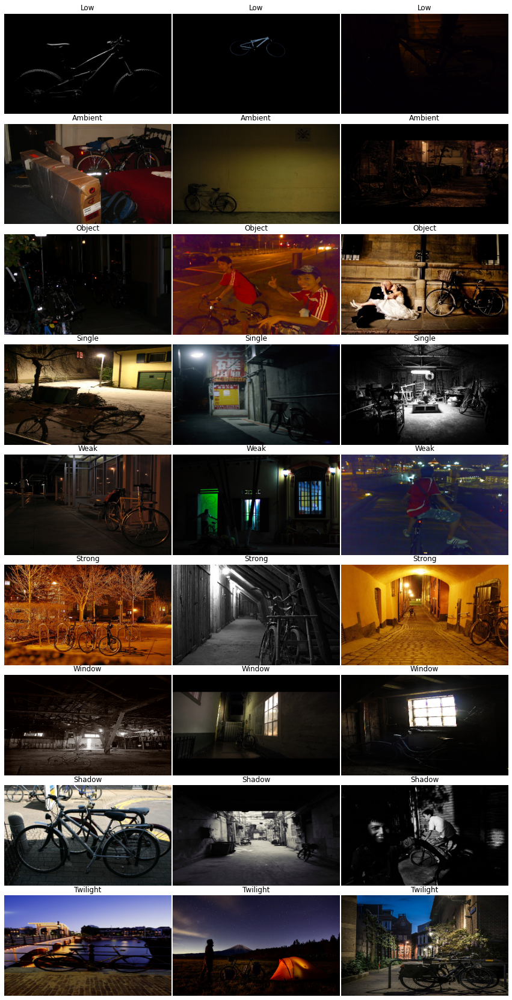

In [ ]:
plot_sample_images(1,3)

<b> Car Object Data Analysis

The Car data shape is (638, 5)


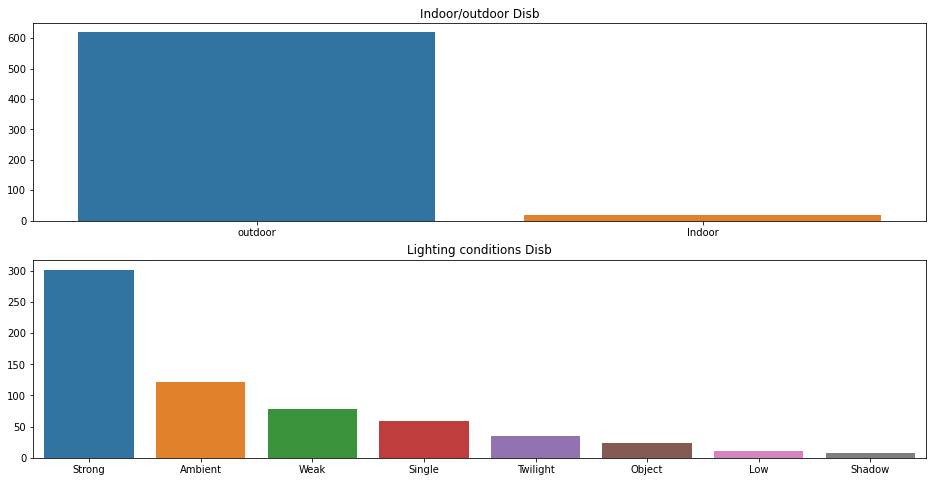

In [ ]:
get_class_analysis(5)

Below are few of the Car images in different lighting conditions


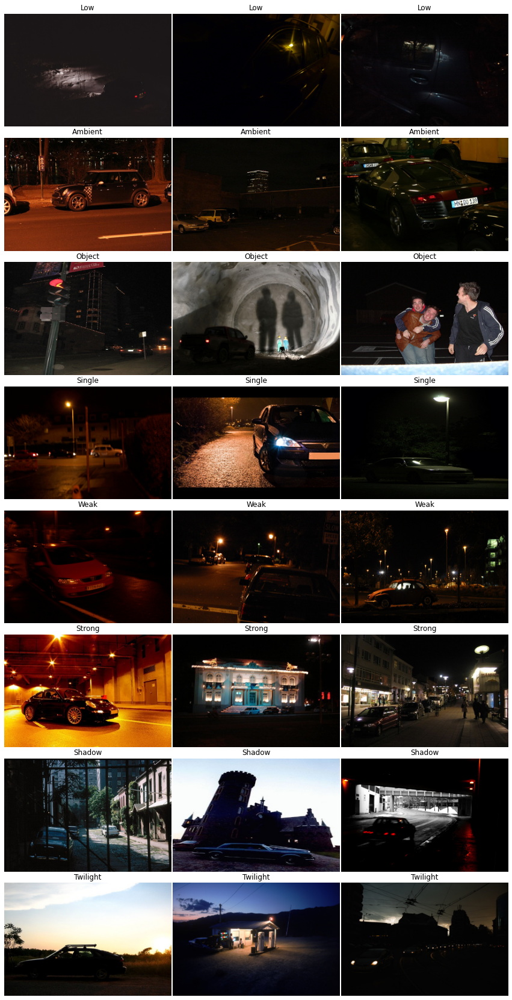

In [ ]:
plot_sample_images(5,3)

<b> Motorbike Object Data Analysis

The Motorbike data shape is (503, 5)


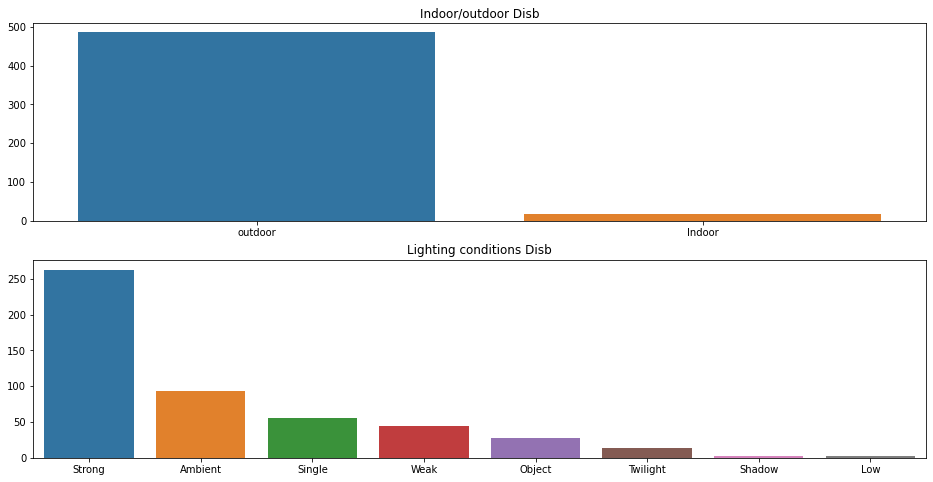

In [ ]:
get_class_analysis(10)

Below are few of the Motorbike images in different lighting conditions


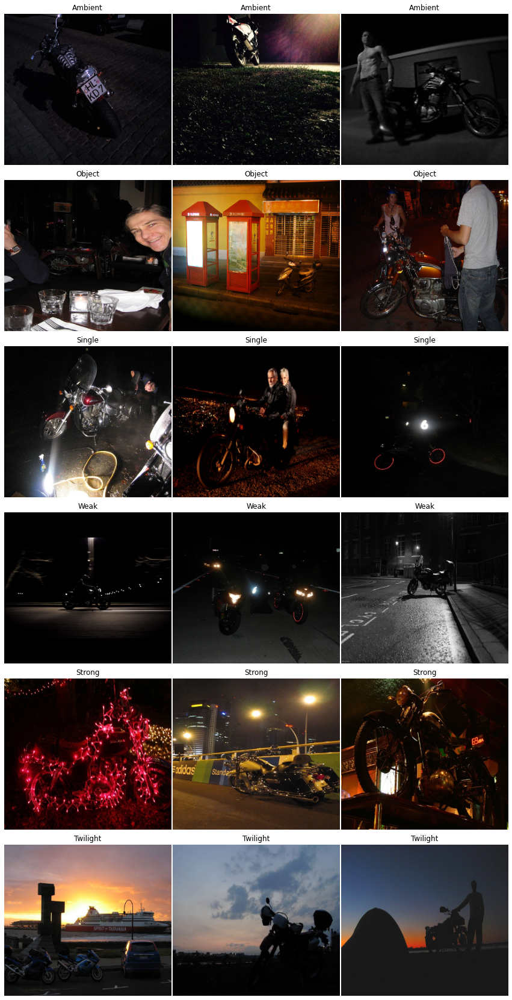

In [ ]:
plot_sample_images(10,3)

#### Observations from EDA:

- The indoor images are very less in number compared to outdoor images
- The lightning conditions included in this dataset might be a challenging in object detection.
- Seems like 'low' light condition images are difficult for object detection. Lets anlyze further if we can enhance this images by any CNN architecture / methods for better object detection.

### Model Training

In [ ]:
# cloning the pytorchyolo github repository

!git clone https://github.com/eriklindernoren/PyTorch-YOLOv3

Cloning into 'PyTorch-YOLOv3'...
remote: Enumerating objects: 1837, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 1837 (delta 0), reused 0 (delta 0), pack-reused 1834
Receiving objects: 100% (1837/1837), 16.54 MiB | 10.74 MiB/s, done.
Resolving deltas: 100% (1100/1100), done.


In [ ]:
# downloading the yolov3 pretrained weights and darknet53 weights

!./weights/download_weights.sh

--2022-09-03 23:43:29--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  9.15MB/s    in 34s     

2022-09-03 23:44:04 (7.04 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]

--2022-09-03 23:44:05--  https://pjreddie.com/media/files/yolov3-tiny.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35434956 (34M) [application/octet-stream]
Saving to: ‘yolov3-tiny.weights’

yolov3-tiny.weights 100%[===================>]  33.79M  8.43MB/s    in 5.5s    

2022-09-03 23:44:11 (6.11 MB/s) - ‘yolov3-tiny.weights’ saved [35434956/35434956]

--202

#### Preparing the Annotations for Model training and evaluation


As per the instructions given by pytorchYolo, performing the below steps.
- Moving all the images to PytorchYolo->data->custom->images folder
- Modifying the annotations file by replacing object class names with 0 indexed numbers.
- Moving all the labels to PytorchYolo->data->custom->labels folder.
- Normalizing the bounding box values to lie between [0,1]
- Spliting the data to train and validation and creating the respective .txt files with complete image path in each line.
- Modify the Yolov3-custom.config file according to the classes count. 
- Training the Yolov3 model on exdark dataset.

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import argparse
import fileinput
import shutil
import pandas as pd

In [ ]:
# copying the images from ExDark folder to PyTorch Data custom folder

os.chdir("/home/ruthvik/jupyter/aaic/DL/self_case_study_2")

ROOT_DIR = os.getcwd()

os.chdir(os.path.join("ExDark", "Dataset"))
DIRS = os.listdir(os.getcwd())

print(DIRS)
print(os.getcwd())

dest_dir = '/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/'

for DIR in DIRS:
    if os.path.isdir(DIR):
        
        print("Currently in subdirectory:", DIR)

        # path to source directory
        src_dir = DIR

        # getting all the files in the source directory
        files = os.listdir(src_dir)
        
        for fname in tqdm(files):
     
            # copying the files to the
            # destination directory
            shutil.copy2(os.path.join(src_dir,fname), dest_dir)

os.chdir("/home/ruthvik/jupyter/aaic/DL/self_case_study_2")

['People', 'Bottle', 'Bicycle', 'Car', 'Boat', 'Dog', 'Cat', 'Chair', 'Bus', 'Table', 'Cup', 'Motorbike']
/home/ruthvik/jupyter/aaic/DL/self_case_study_2/ExDark/Dataset
Currently in subdirectory: People


100%|██████████| 609/609 [00:07<00:00, 76.35it/s]


Currently in subdirectory: Bottle


100%|██████████| 547/547 [00:05<00:00, 91.75it/s] 


Currently in subdirectory: Bicycle


100%|██████████| 652/652 [00:07<00:00, 89.38it/s] 


Currently in subdirectory: Car


100%|██████████| 638/638 [00:30<00:00, 20.70it/s]


Currently in subdirectory: Boat


100%|██████████| 679/679 [00:18<00:00, 37.58it/s] 


Currently in subdirectory: Dog


100%|██████████| 801/801 [00:09<00:00, 87.77it/s] 


Currently in subdirectory: Cat


100%|██████████| 735/735 [00:12<00:00, 61.06it/s]


Currently in subdirectory: Chair


100%|██████████| 648/648 [00:32<00:00, 20.14it/s]


Currently in subdirectory: Bus


100%|██████████| 527/527 [00:19<00:00, 26.83it/s]


Currently in subdirectory: Table


100%|██████████| 505/505 [00:08<00:00, 57.15it/s]


Currently in subdirectory: Cup


100%|██████████| 519/519 [00:05<00:00, 95.94it/s] 


Currently in subdirectory: Motorbike


100%|██████████| 503/503 [00:11<00:00, 43.73it/s]


In [ ]:
#Preprocessing the annotations file by changing label name to 0 indexed numbers

os.chdir("/home/ruthvik/jupyter/aaic/DL/self_case_study_2")
ROOT_DIR = os.getcwd()

# create dict to map class names to numbers for yolo
classes = {}
with open("classes.txt", "r") as myFile:
    for num, line in enumerate(myFile, 0):
        line = line.rstrip("\n")
        classes[line] = num
    myFile.close()
    
# step into annotations directory
os.chdir(os.path.join("ExDark", "Annotations"))
DIRS = os.listdir(os.getcwd())

print(classes)
print(DIRS)
print(os.getcwd())

for DIR in DIRS:

    if os.path.isdir(DIR):
        
        os.chdir(DIR)
        print("Currently in subdirectory:", DIR)


        for filename in tqdm(os.listdir(os.getcwd())):
            filename_str = str.split(filename, ".")[0]

            if filename.endswith(".txt"):
                annotations = []

                with open(filename) as f:
                    for l,line in enumerate(f):
                        if l==0:
                            continue
                        class_label = line.split()[0]
                        #excluded_classes =[]
                        if class_label.lower() not in list(classes.keys()):
                            #excluded_classes.append(class_label)
                            continue
                            
                        line = line.replace(class_label,class_label.lower())
                        
                        line = line.replace(class_label.lower(), str(classes[class_label.lower()]))

                        labels = line.split()
                        coords = np.asarray([float(labels[1]), float(labels[2]), float(labels[3]), float(labels[4])])
            
                        labels[1], labels[2], labels[3], labels[4] = coords[0], coords[1], coords[2], coords[3]
                        newline = str(labels[0]) + " " + str(labels[1]) + " " + str(labels[2]) + " " + str(labels[3]) + " " + str(labels[4])
                        line = line.replace(line, newline)
                        annotations.append(line)
                    f.close()
               
                with open(filename, "w") as outfile:
                    for line in annotations:
                        outfile.write(line)
                        outfile.write("\n")
                    outfile.close()
    
        os.chdir("..")



{'bicycle': 0, 'boat': 1, 'bottle': 2, 'bus': 3, 'car': 4, 'cat': 5, 'chair': 6, 'cup': 7, 'dog': 8, 'motorbike': 9, 'people': 10, 'table': 11}
['People', 'Bottle', 'Bicycle', 'Car', 'Boat', 'Dog', 'Cat', 'Chair', 'Bus', 'Table', 'Cup', 'Motorbike']
/home/ruthvik/jupyter/aaic/DL/self_case_study_2/ExDark/Annotations
Currently in subdirectory: People


100%|██████████| 609/609 [00:00<00:00, 3368.72it/s]


Currently in subdirectory: Bottle


100%|██████████| 547/547 [00:00<00:00, 656.41it/s]


Currently in subdirectory: Bicycle


100%|██████████| 652/652 [00:00<00:00, 2199.58it/s]


Currently in subdirectory: Car


100%|██████████| 638/638 [00:00<00:00, 3351.80it/s]


Currently in subdirectory: Boat


100%|██████████| 679/679 [00:00<00:00, 3697.14it/s]


Currently in subdirectory: Dog


100%|██████████| 801/801 [00:00<00:00, 3906.66it/s]


Currently in subdirectory: Cat


100%|██████████| 735/735 [00:00<00:00, 3388.85it/s]


Currently in subdirectory: Chair


100%|██████████| 648/648 [00:00<00:00, 3305.54it/s]


Currently in subdirectory: Bus


100%|██████████| 527/527 [00:00<00:00, 3202.19it/s]


Currently in subdirectory: Table


100%|██████████| 505/505 [00:00<00:00, 3111.13it/s]


Currently in subdirectory: Cup


100%|██████████| 519/519 [00:00<00:00, 3695.77it/s]


Currently in subdirectory: Motorbike


100%|██████████| 503/503 [00:00<00:00, 2909.68it/s]


In [ ]:
# copying all the annotations to one folder 

os.chdir("/home/ruthvik/jupyter/aaic/DL/self_case_study_2/")
ROOT_DIR = os.getcwd()

os.chdir(os.path.join("ExDark", "Annotations"))
DIRS = os.listdir(os.getcwd())

print(DIRS)
print(os.getcwd())

dest_dir = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/ExDark/labels/"


for DIR in DIRS:
    if os.path.isdir(DIR):
        
        print("Currently in subdirectory:", DIR)

        # path to source directory
        src_dir = DIR

        # getting all the files in the source directory
        files = os.listdir(src_dir)
        
        for fname in tqdm(files):
            # copying the files to the
            # destination directory
            shutil.copy2(os.path.join(src_dir,fname), dest_dir)


['People', 'Bottle', 'Bicycle', 'Car', 'Boat', 'Dog', 'Cat', 'Chair', 'Bus', 'Table', 'Cup', 'Motorbike']
/home/ruthvik/jupyter/aaic/DL/self_case_study_2/ExDark/Annotations
Currently in subdirectory: People


100%|██████████| 609/609 [00:00<00:00, 4918.05it/s]


Currently in subdirectory: Bottle


100%|██████████| 547/547 [00:00<00:00, 5094.57it/s]


Currently in subdirectory: Bicycle


100%|██████████| 652/652 [00:00<00:00, 4478.09it/s]


Currently in subdirectory: Car


100%|██████████| 638/638 [00:00<00:00, 5104.57it/s]


Currently in subdirectory: Boat


100%|██████████| 679/679 [00:00<00:00, 4640.89it/s]


Currently in subdirectory: Dog


100%|██████████| 801/801 [00:00<00:00, 5289.49it/s]


Currently in subdirectory: Cat


100%|██████████| 735/735 [00:00<00:00, 5113.53it/s]


Currently in subdirectory: Chair


100%|██████████| 648/648 [00:00<00:00, 4651.60it/s]


Currently in subdirectory: Bus


100%|██████████| 527/527 [00:00<00:00, 4482.72it/s]


Currently in subdirectory: Table


100%|██████████| 505/505 [00:00<00:00, 4075.02it/s]


Currently in subdirectory: Cup


100%|██████████| 519/519 [00:00<00:00, 5300.88it/s]


Currently in subdirectory: Motorbike


100%|██████████| 503/503 [00:00<00:00, 4566.32it/s]


In [ ]:
#copying the labels to pytorch data custom folder

src_dir = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/ExDark/labels/"

os.chdir(src_dir)

des_dir = '/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/labels/'

files = os.listdir(src_dir)


# chaging the file name to filename.txt format

for file in tqdm(files):
    
    lst = file.split('.')
    fname = lst[0]+'.'+lst[2]
    lines =[]
    with open(file) as f:
        for line in f:
            lines.append(line)
    os.chdir(des_dir)
    with open(fname, 'w') as fn:
        for line in lines:
            fn.write(line)
            #fn.write('\n')
        fn.close()
    os.chdir(src_dir)


100%|██████████| 7363/7363 [00:01<00:00, 5499.21it/s]


In [ ]:
# normalizing the bounding box values to [0,1]

def convert(img_w,img_h, box):

    x = box[0] + (box[2]/2.0)
    y = box[1] + (box[3]/2.0)

    x = x/img_w
    y = y/img_h
    
    w = box[2]/img_w
    h = box[3]/img_h

    return x,y,w,h

img_dir = '/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/'

txt_dir = '/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/labels/'

images_files = os.listdir(img_dir)

txt_files = os.listdir(txt_dir)

for image in tqdm(images_files):
    if os.path.isfile(img_dir+image):
        img = cv2.imread(os.path.join(img_dir,image))
        img_h , img_w, _ = img.shape

        fname = image.split('.')[0]
        fname = fname+'.txt'
        txt_file = os.path.join(txt_dir,fname)
        lines =[]
        with open(txt_file) as f:
            for line in f:
                labels = line.split()
                labels[0]= int(labels[0])
                labels[1],labels[2],labels[3],labels[4] = float(labels[1]),float(labels[2]),float(labels[3]),float(labels[4])
                box = [labels[1],labels[2],labels[3],labels[4]]
                labels[1],labels[2],labels[3],labels[4] = convert(img_w,img_h,box)
                new_line = ' '.join(str(i) for i in labels)
                line = line.replace(line,new_line)
                lines.append(line)
            f.close()
        with open(txt_file,'w') as fw:
            for line in lines:
                fw.write(line)
                fw.write("\n")
            fw.close()
      


 48%|████▊     | 3546/7363 [01:19<00:51, 73.44it/s]libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: cHRM chunk does not match sRGB
 66%|██████▌   | 4839/7363 [01:49<00:46, 54.33it/s]libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: cHRM chunk does not match sRGB
100%|██████████| 7363/7363 [02:49<00:00, 43.44it/s]


<b>Colab training

In [1]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import argparse
import fileinput
import shutil
import pandas as pd

In [2]:
#reading the .csv file created earlier to split data to train, validation

#os.chdir('/content')

df = pd.read_csv('processed_data.csv')
df.head()

,path,classes,light,indoor_outdoor,train_val_test
0,ExDark/Dataset/Bicycle/2015_00001.png,1,2,1,1
1,ExDark/Dataset/Bicycle/2015_00002.png,1,6,2,1
2,ExDark/Dataset/Bicycle/2015_00003.png,1,5,2,1
3,ExDark/Dataset/Bicycle/2015_00004.jpg,1,3,2,1
4,ExDark/Dataset/Bicycle/2015_00005.jpg,1,6,2,1


In [3]:
# using the train and test data as train dataset. 

train = df[(df['train_val_test']==1) | (df['train_val_test']==3)]
train['classes'].value_counts()

9     651
6     585
2     529
1     502
7     498
5     488
11    459
3     397
4     377
8     369
12    355
10    353
Name: classes, dtype: int64

In [4]:
# using the valid data as validation dataset.

valid = df[df['train_val_test']==2]
valid['classes'].value_counts()

1     150
2     150
3     150
4     150
5     150
6     150
7     150
8     150
9     150
10    150
11    150
12    150
Name: classes, dtype: int64

In [5]:
#downloading the PytorchYolov3 folder into colab

!gdown --id '1XSLsUYbOh-Mq_EzQ37VBj7g3dwoKrFSH'

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1XSLsUYbOh-Mq_EzQ37VBj7g3dwoKrFSH
To: /content/PyTorch-YOLOv3.zip
100% 1.93G/1.93G [00:10<00:00, 188MB/s]


In [6]:
!unzip -q PyTorch-YOLOv3.zip

In [7]:
%cd /content/PyTorch-YOLOv3/

/content/PyTorch-YOLOv3


In [8]:
!pip3 install -q poetry

     |████████████████████████████████| 210 kB 8.8 MB/s 
     |████████████████████████████████| 83 kB 1.8 MB/s 
     |████████████████████████████████| 140 kB 80.2 MB/s 
     |████████████████████████████████| 526 kB 87.5 MB/s 
     |████████████████████████████████| 78 kB 8.8 MB/s 
     |████████████████████████████████| 8.8 MB 93.7 MB/s 
     |████████████████████████████████| 54 kB 2.9 MB/s 
     |████████████████████████████████| 495 kB 89.1 MB/s 
     |████████████████████████████████| 48 kB 6.2 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 4.0 MB 76.3 MB/s 
     |████████████████████████████████| 468 kB 89.0 MB/s 


In [9]:
!poetry -q install

tcmalloc: large alloc 1763803136 bytes == 0x4610000 @  0x7f5ae4c2c2a4 0x7f5ae4ea2b9f 0x7f5ae4ead215 0x7f5ae4eacdce 0x7f5ae4eacdce 0x7f5ae4eaace4 0x7f5ae4eab48e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x511e2c 0x549576 0x593fce 0x511e2c 0x549576 0x4bcb19 0x59c019 0x595ef6 0x5fbece 0x594b72 0x548cc1 0x51566f 0x593dd7 0x548ae9 0x51566f 0x549576


In [10]:
# creating the train text file with respective images path in each line

img_dir = '/content/PyTorch-YOLOv3/data/custom/images/'
os.chdir('/content/PyTorch-YOLOv3/data/custom/')

train_file = 'train.txt'

with open(train_file,'w') as tf:
    for img in tqdm(train['path']):
        file = img.split('/')[-1]
        path = os.path.join(img_dir,file)
        if os.path.isfile(path):
            tf.write(path)
            tf.write('\n')
    tf.close()

100%|██████████| 5563/5563 [00:00<00:00, 160681.71it/s]


In [11]:
# creating the valid text file with respective images path in each line


img_dir = '/content/PyTorch-YOLOv3/data/custom/images/'
os.chdir('/content/PyTorch-YOLOv3/data/custom/')

valid_file = 'valid.txt'

with open(valid_file,'w') as vf:
    for img in tqdm(valid['path']):
        file = img.split('/')[-1]
        path = os.path.join(img_dir,file)
        if os.path.isfile(path):
            vf.write(path)
            vf.write('\n')
    vf.close()

100%|██████████| 1800/1800 [00:00<00:00, 131151.69it/s]


In [ ]:
# training the model with yolov2-custom.config, custom.data, darknet weights for 200 epochs.

!poetry run yolo-train --model config/yolov3-custom.cfg --data config/custom.data --pretrained_weights weights/darknet53.conv.74

Environment information:
System: Linux 5.4.188+
Current Version: pytorchyolo 1.6.2
Current Commit Hash: 3f7f04b
Command line arguments: Namespace(checkpoint_interval=1, conf_thres=0.1, data='config/custom.data', epochs=200, evaluation_interval=1, iou_thres=0.5, logdir='logs', model='config/yolov3-custom.cfg', multiscale_training=False, n_cpu=8, nms_thres=0.5, pretrained_weights='weights/darknet53.conv.74', seed=-1, verbose=False)
/root/.cache/pypoetry/virtualenvs/pytorchyolo-9v2T40J2-py3.7/lib/python3.7/site-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))

---- Training Model ----
Training Epoch 1: 100% 2782/2782 [

#### Validation

In [ ]:
# evaluating the trained model performance on validation data. 
# we were able to train the model till 200 epoch but only saved the weights till 140 epoch. 

!poetry run yolo-test --model config/yolov3-custom.cfg --weights weights/yolov3_ckpt_140.pth

Environment information:
System: Linux 5.15.0-47-generic
Current Version: pytorchyolo 1.6.2
Current Commit Hash: 3f7f04b
Command line arguments: Namespace(model='config/yolov3-custom.cfg', weights='weights/yolov3_ckpt_140.pth', data='config/coco.data', batch_size=8, verbose=False, img_size=416, n_cpu=4, iou_thres=0.5, conf_thres=0.01, nms_thres=0.4)
Computing AP: 100%|█████████████████████████████| 12/12 [00:00<00:00, 23.79it/s]
+-------+-----------+---------+
| Index | Class     | AP      |
+-------+-----------+---------+
| 0     | bicycle   | 0.28796 |
| 1     | boat      | 0.10008 |
| 2     | bottle    | 0.17409 |
| 3     | bus       | 0.37913 |
| 4     | car       | 0.28274 |
| 5     | cat       | 0.17478 |
| 6     | chair     | 0.14753 |
| 7     | cup       | 0.15003 |
| 8     | dog       | 0.27449 |
| 9     | motorbike | 0.32809 |
| 10    | people    | 0.30138 |
| 11    | table     | 0.15793 |
+-------+-----------+---------+
---- mAP 0.22985 ----


In [13]:
os.chdir('/content')

### Image Enhancement using Pre-trained MIRNet

In [14]:
# here we are using the pre-trained MIRNet model for image enhancement. 
#cloning the MIRNet github repo

!git clone https://github.com/soumik12345/MIRNet


Cloning into 'MIRNet'...
remote: Enumerating objects: 251, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 251 (delta 10), reused 8 (delta 8), pack-reused 237
Receiving objects: 100% (251/251), 28.13 MiB | 5.27 MiB/s, done.
Resolving deltas: 100% (112/112), done.


In [15]:
%cd MIRNet/

/content/MIRNet


In [18]:
# downloading the pre-trained weights on LOL dataset. 

!gdown --id '19EUIDefC3sZdDM6ZuPovaR2RHR13vfg_'

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=19EUIDefC3sZdDM6ZuPovaR2RHR13vfg_
To: /content/MIRNet/low_light_weights_best.h5
100% 148M/148M [00:00<00:00, 241MB/s]


In [19]:
!pip install -q wandb

     |████████████████████████████████| 1.8 MB 28.5 MB/s 
     |████████████████████████████████| 181 kB 87.4 MB/s 
     |████████████████████████████████| 158 kB 99.5 MB/s 
     |████████████████████████████████| 63 kB 1.9 MB/s 


In [20]:
from glob import glob  #
from PIL import Image  #For image operations
from matplotlib import pyplot as plt #for visualization
# Importing required dependencies from MIRNet
from mirnet.inference import Inferer
from mirnet.utils import download_dataset, plot_result
import tensorflow as tf # For modelling
import numpy as np # For mathematical computation

In [21]:
inferer = Inferer()
#inferer.download_weights('1sUlRD5MTRKKGxtqyYDpTv7T3jOW6aVAL')
inferer.build_model(num_rrg=3, num_mrb=2, channels=64,      weights_path='low_light_weights_best.h5')
#inferer.model.summary()

In [73]:
# here we are enhancing the images using above MIRNet model and saving to new dir. 
# also the max width and height of images are resized to 1024 as per model limitations. 

import os
from tqdm import tqdm


src_dir = '/content/PyTorch-YOLOv3/data/custom/images/'

resize_dir = '/content/PyTorch-YOLOv3/data/custom/images_resize/'

dest_dir = '/content/PyTorch-YOLOv3/data/custom/images_enh/'

images = os.listdir(src_dir)

for img in tqdm(images):
    img_name = img
    img = os.path.join(src_dir,img)
    img_read = cv2.imread(img)
    h,w,_ = img_read.shape
    if w>1024:
      w=1024
    if h>1024:
      h=1024
    path = os.path.join(resize_dir,img_name) 
    img_read = cv2.resize(img_read, (w,h),interpolation=cv2.INTER_NEAREST)
    cv2.imwrite(path,img_read)
    img_final = os.path.join(resize_dir,img_name)
    original_image, output_image = inferer.infer(img_final)
    output_image.save(os.path.join(dest_dir,img_name))


100%|██████████| 7363/7363 [4:32:15<00:00,  2.22s/it]


In [76]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [80]:
# saving the enhanced images to drive for further use

!zip -r -q /content/drive/MyDrive/aaic/DL/images_enh.zip /content/PyTorch-YOLOv3/data/custom/images_enh

In [21]:
%cd /content/

/content


In [22]:
!gdown --id '1-DNYYFVXvbkUNMQZNUFI7TvTbWQN7sFk'

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1-DNYYFVXvbkUNMQZNUFI7TvTbWQN7sFk
To: /content/images_enh.zip
100% 826M/826M [00:05<00:00, 149MB/s]


### Training the Yolov3 model on the Enhanced Images

In [26]:
%cd /content/PyTorch-YOLOv3/

/content/PyTorch-YOLOv3


In [28]:
# training the model with yolov2-custom.config, custom.data, darknet weights for 140 epochs.

!poetry run yolo-train --model config/yolov3-custom.cfg --data config/custom.data --pretrained_weights weights/darknet53.conv.74

Environment information:
System: Linux 5.10.133+
Current Version: pytorchyolo 1.6.2
Current Commit Hash: 3f7f04b
Command line arguments: Namespace(checkpoint_interval=1, conf_thres=0.1, data='config/custom.data', epochs=140, evaluation_interval=1, iou_thres=0.5, logdir='logs', model='config/yolov3-custom.cfg', multiscale_training=False, n_cpu=8, nms_thres=0.5, pretrained_weights='weights/darknet53.conv.74', seed=-1, verbose=False)
/root/.cache/pypoetry/virtualenvs/pytorchyolo-9v2T40J2-py3.7/lib/python3.7/site-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))

---- Training Model ----
Training Epoch 1: 100% 2782/2782 

In [30]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [31]:
# saving the last epoch weights

!zip -r -q /content/drive/MyDrive/aaic/DL/model_enh_140.zip /content/PyTorch-YOLOv3/checkpoints/yolov3_ckpt_140.pth

In [37]:
# saving the weights with best validation mAP

!zip -r -q /content/drive/MyDrive/aaic/DL/model_enh_138.zip /content/PyTorch-YOLOv3/checkpoints/yolov3_ckpt_138.pth

### Validation on Enhanced images 

In [35]:
!poetry run yolo-test --model config/yolov3-custom.cfg --weights weights/yolov3_ckpt_140.pth

Environment information:
System: Linux 5.10.133+
Current Version: pytorchyolo 1.6.2
Current Commit Hash: 3f7f04b
Command line arguments: Namespace(batch_size=8, conf_thres=0.01, data='config/custom.data', img_size=416, iou_thres=0.5, model='config/yolov3-custom.cfg', n_cpu=4, nms_thres=0.4, verbose=False, weights='weights/yolov3_ckpt_140.pth')
Validating: 100% 225/225 [00:24<00:00,  9.20it/s]
Computing AP: 100% 12/12 [00:00<00:00, 146.44it/s]
+-------+-----------+---------+
| Index | Class     | AP      |
+-------+-----------+---------+
| 0     | bicycle   | 0.37214 |
| 1     | boat      | 0.14058 |
| 2     | bottle    | 0.15150 |
| 3     | bus       | 0.42284 |
| 4     | car       | 0.35567 |
| 5     | cat       | 0.18547 |
| 6     | chair     | 0.17177 |
| 7     | cup       | 0.12041 |
| 8     | dog       | 0.31598 |
| 9     | motorbike | 0.27433 |
| 10    | people    | 0.31693 |
| 11    | table     | 0.16407 |
+-------+-----------+---------+
---- mAP 0.24931 ----


In [36]:
!poetry run yolo-test --model config/yolov3-custom.cfg --weights checkpoints/yolov3_ckpt_138.pth

Environment information:
System: Linux 5.10.133+
Current Version: pytorchyolo 1.6.2
Current Commit Hash: 3f7f04b
Command line arguments: Namespace(batch_size=8, conf_thres=0.01, data='config/custom.data', img_size=416, iou_thres=0.5, model='config/yolov3-custom.cfg', n_cpu=4, nms_thres=0.4, verbose=False, weights='checkpoints/yolov3_ckpt_138.pth')
Validating: 100% 225/225 [00:23<00:00,  9.49it/s]
Computing AP: 100% 12/12 [00:00<00:00, 166.96it/s]
+-------+-----------+---------+
| Index | Class     | AP      |
+-------+-----------+---------+
| 0     | bicycle   | 0.40662 |
| 1     | boat      | 0.14844 |
| 2     | bottle    | 0.15666 |
| 3     | bus       | 0.43382 |
| 4     | car       | 0.35943 |
| 5     | cat       | 0.17872 |
| 6     | chair     | 0.18425 |
| 7     | cup       | 0.14475 |
| 8     | dog       | 0.34639 |
| 9     | motorbike | 0.29152 |
| 10    | people    | 0.32822 |
| 11    | table     | 0.17083 |
+-------+-----------+---------+
---- mAP 0.26247 ----


### Inference

In [1]:
%cd PyTorch-YOLOv3/

/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3


In [2]:
import numpy as np
from numpy import expand_dims
from matplotlib import pyplot
from matplotlib.patches import Rectangle
import cv2
from pytorchyolo import detect, models

In [58]:

def get_boxes(config,weights,image):
    
    # Load the YOLO model
    model = models.load_model(config, weights)

    # Load the image as a numpy array
    img = cv2.imread(image)

    # Convert OpenCV bgr to rgb
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Runs the YOLO model on the image 
    boxes = detect.detect_image(model, img)
    
    # Output will be a numpy array in the following format:
    # [[x1, y1, x2, y2, confidence, class]]

    return boxes


# draw all results
def draw_boxes(filename,boxes):
    # load the image
    data = pyplot.imread(filename)
    # plot the image
    pyplot.imshow(data)
    # get the context for drawing boxes
    ax = pyplot.gca()
    # plot each box
    for box in boxes:
        # get coordinates
        x1, y1, x2, y2 = box[0], box[1], box[2], box[3]
        
        # calculate width and height of the box
        width, height = x2 - x1, y2 - y1
        
        # create the shape
        rect = Rectangle((x1, y1), width, height, fill=False, color='white')
        # draw the box
        ax.add_patch(rect)
        # draw text and score in top left corner
        label = "%s (%.3f)" % (labels[box[5]], box[4])
        print(label)
        pyplot.text(x1, y1, label, color='white')
    # show the plot
    pyplot.show()


In [59]:
# define the labels
labels = {0:'bicycle',1:'boat',2:'bottle',3:'bus',4:'car',5:'cat',6:'chair',7:'cup',8:'dog',9:'motorbike',10:'people',11:'table'}



In [5]:
custom_config = 'config/yolov3-custom.cfg'
model_2_weights = 'weights/model_2_ckpt_138.pth'
model_1_weights = 'weights/model_1_ckpt_140.pth'


#### Model 1 Inference on original Dark images

- here testing on few extremely low light images for model 1 and model 2

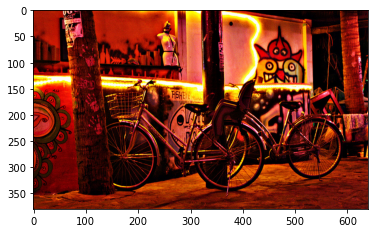

In [6]:
image = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_00251.jpg"

boxes = get_boxes(custom_config,model_1_weights,image)
draw_boxes(image,boxes)

car (0.652)


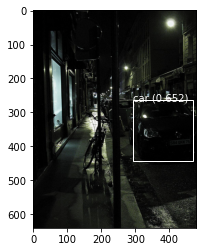

In [7]:
image = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_00252.jpg"

boxes = get_boxes(custom_config,model_1_weights,image)
draw_boxes(image,boxes)

people (0.594)


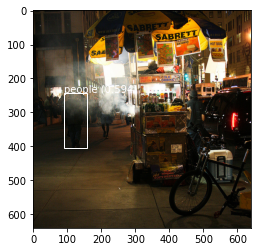

In [8]:
image = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_00267.jpg"

boxes = get_boxes(custom_config,model_1_weights,image)
draw_boxes(image,boxes)

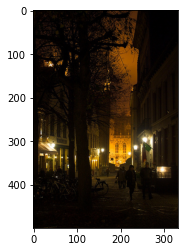

In [9]:
image = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_00255.jpg"

boxes = get_boxes(custom_config,model_1_weights,image)
draw_boxes(image,boxes)

#### Model 2 Inference on Enhanced Images

bicycle (0.648)
bicycle (0.515)


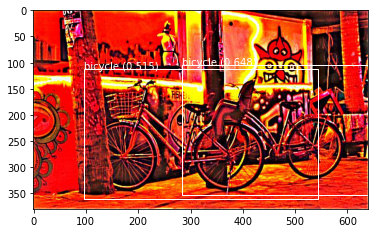

In [10]:
image = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images_enh/2015_00251.jpg"

boxes = get_boxes(custom_config,model_2_weights,image)
draw_boxes(image,boxes)

car (0.575)


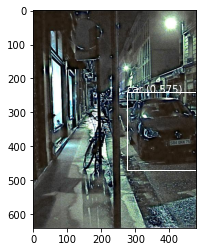

In [11]:
image = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images_enh/2015_00252.jpg"

boxes = get_boxes(custom_config,model_2_weights,image)
draw_boxes(image,boxes)

people (0.676)
people (0.649)


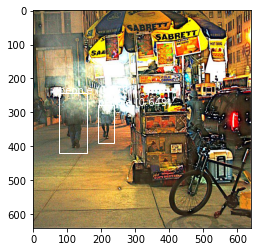

In [12]:
image = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images_enh/2015_00267.jpg"

boxes = get_boxes(custom_config,model_2_weights,image)
draw_boxes(image,boxes)

bicycle (0.739)


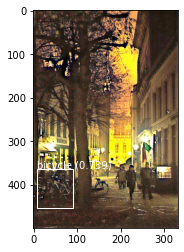

In [13]:
image = "/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images_enh/2015_00255.jpg"

boxes = get_boxes(custom_config,model_2_weights,image)
draw_boxes(image,boxes)

### Observations:

- For the enhanced images the model performs well when compared with orginal images earlier. 
- the mAP of 0.20 for first model took approx 200 epoch where as for enhanced images we got approx for 140 epochs. 
- From the inference part above, we can see the model 2 detects objects well in extremely low light images after their enhancement.

In [14]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Architecture","Dataset" ,"Epochs","Validation mAP "]

x.add_row(["YoloV3","Dark Images(raw-data)",'140','0.22985' ])
x.add_row(["YoloV3","Enhanced Images(using MIRNet)",'138','0.26247' ])

print(x)

+--------------+-------------------------------+--------+-----------------+
| Architecture |            Dataset            | Epochs | Validation mAP  |
+--------------+-------------------------------+--------+-----------------+
|    YoloV3    |     Dark Images(raw-data)     |  140   |     0.22985     |
|    YoloV3    | Enhanced Images(using MIRNet) |  138   |     0.26247     |
+--------------+-------------------------------+--------+-----------------+


### Future Improvements

- In this case study due to computing resource limitation, we only trained for lesser no.of epochs but the model performance can be increased by training for more epochs like 300 same as yolov3 on coco dataset. 
- Also the dataset we have is smaller when compared with coco dataset. The model perfornmance can be increased by adding more dark images during training phase
- Also latest yolo algorithms also increases performance due to their multiple improvements. 

###  Data Pipeline

In [1]:
import numpy as np
import pandas as pd
from numpy import expand_dims
from matplotlib import pyplot
from matplotlib.patches import Rectangle
import cv2
from pytorchyolo import detect, models


def predict_objects(config,weights,image):
    
    '''this function takes inputs as model's config,weights file and input image and gives output image 
    with objects predicted and bounding box drawn on input image'''
    
    # define the labels
    labels = {0:'bicycle',1:'boat',2:'bottle',3:'bus',4:'car',5:'cat',6:'chair',7:'cup',8:'dog',9:'motorbike',10:'people',11:'table'}
    
    # Load the YOLO model
    model = models.load_model(config, weights)

    # Load the image as a numpy array
    img = cv2.imread(image)

    # Convert OpenCV bgr to rgb
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Runs the YOLO model on the image 
    boxes = detect.detect_image(model, img)
        
    # load the image
    data = pyplot.imread(image)
    
    # plot the image
    pyplot.imshow(data)
    
    # get the context for drawing boxes
    ax = pyplot.gca()
    
    # plot each box
    for box in boxes:
        # get coordinates
        x1, y1, x2, y2 = box[0], box[1], box[2], box[3]
        
        # calculate width and height of the box
        width, height = x2 - x1, y2 - y1
        
        # create the shape
        rect = Rectangle((x1, y1), width, height, fill=False, color='white')
        # draw the box
        ax.add_patch(rect)
        # draw text and score in top left corner
        label = "%s (%.3f)" % (labels[box[5]], box[4])
        print(label)
        pyplot.text(x1, y1, label, color='white')
        
    # show the plot
    pyplot.show()
    
    

In [2]:
custom_config = 'PyTorch-YOLOv3/config/yolov3-custom.cfg'
model_2_weights = 'PyTorch-YOLOv3/weights/model_2_ckpt_138.pth'
model_1_weights = 'PyTorch-YOLOv3/weights/model_1_ckpt_140.pth'


In [3]:
random_images = ['/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_00308.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_00293.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_02239.JPEG'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_05213.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_05235.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_02770.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_04820.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_00281.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_04034.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_05270.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_03332.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_02137.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_00351.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_00966.jpg'
,'/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/data/custom/images/2015_02251.JPG']

bicycle (0.681)


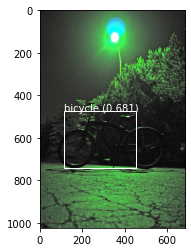

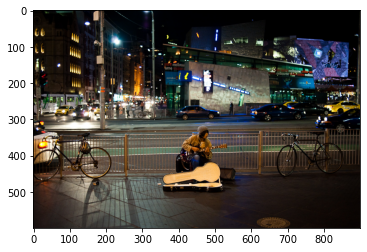

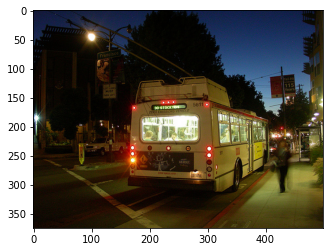

people (0.529)


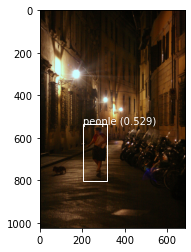

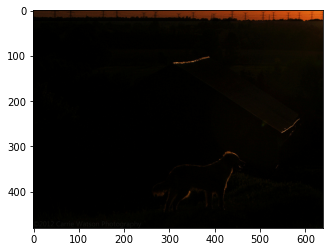

car (0.529)


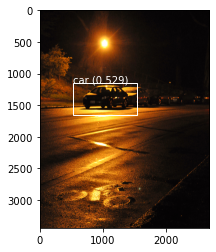

cup (0.889)


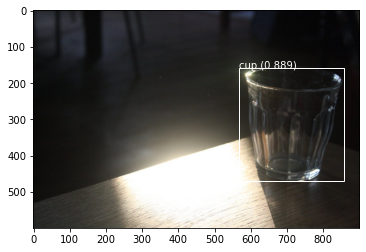

bicycle (0.713)
bicycle (0.699)
people (0.599)
people (0.575)


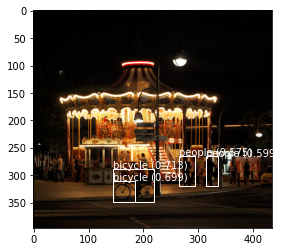

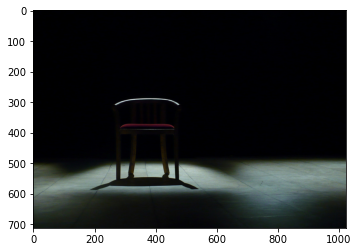

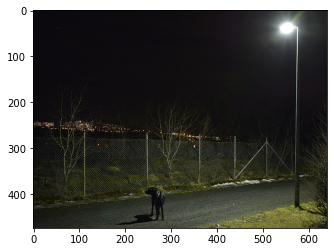

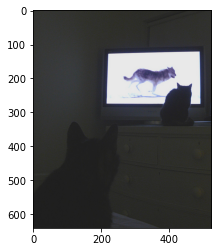

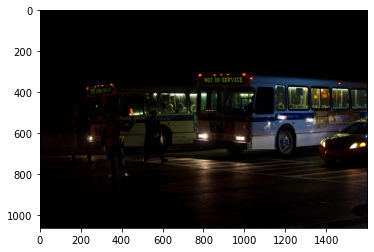

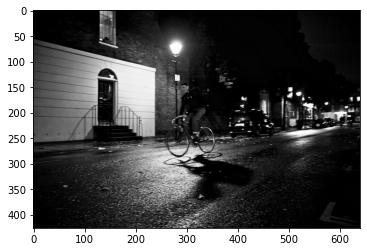

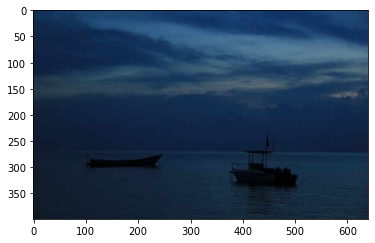

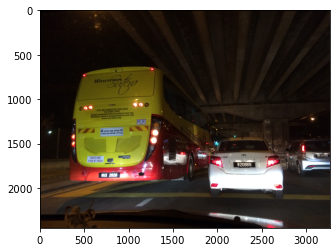

In [4]:
# testing final datapipeline for model 1 on dark images

for image in random_images:
    predict_objects(custom_config,model_1_weights,image)

bicycle (0.751)


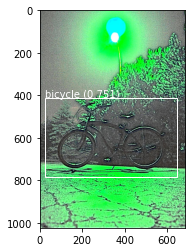

people (0.531)


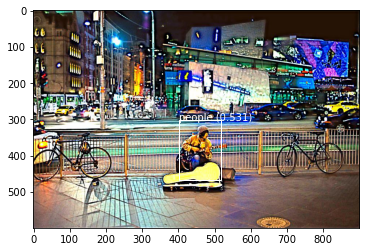

bus (0.524)


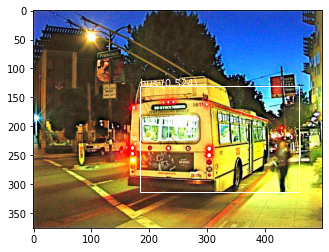

people (0.553)


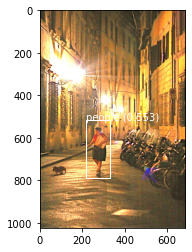

dog (0.572)


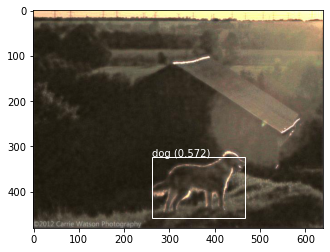

car (0.569)
car (0.526)


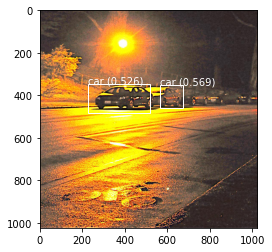

cup (0.812)


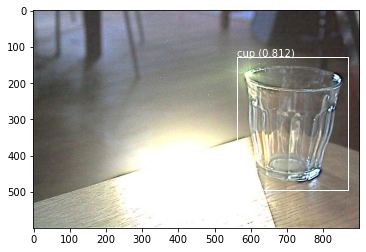

people (0.622)
bicycle (0.549)
people (0.538)


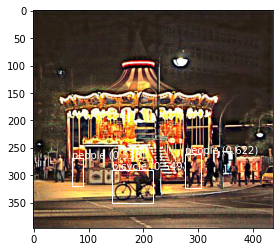

chair (0.624)


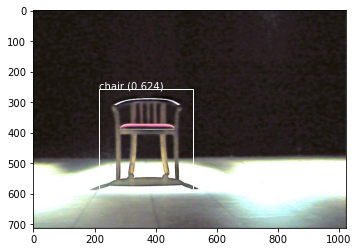

dog (0.797)


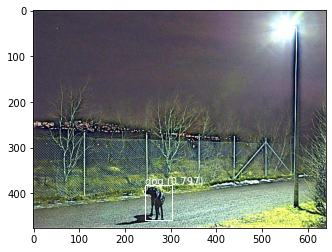

cat (0.722)


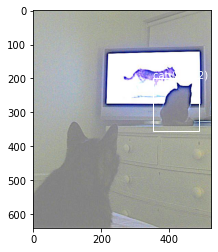

bus (0.591)
people (0.548)


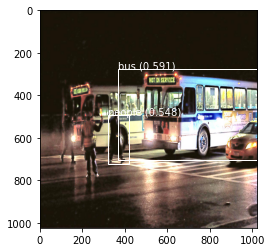

bicycle (0.501)


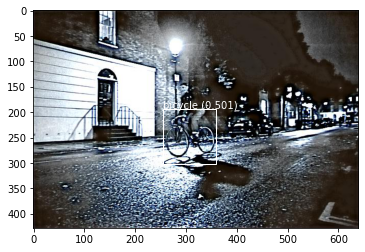

boat (0.764)


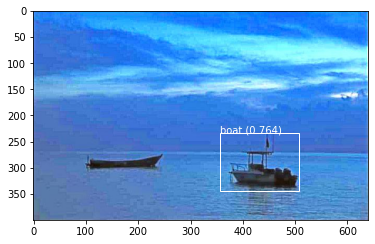

car (0.756)


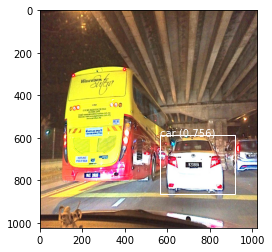

In [5]:
# testing final datapipeline for model 2 on enhanced images

for image in random_images:
    image = image.replace('/images','/images_enh')
    predict_objects(custom_config,model_2_weights,image)

### Conclusion

<b>From the above random plots we can observe even with few epochs training, model 2 performs well on extremely low light images. 

### Function for Final productionization

In [7]:
# here all the pytorch dependencies and MIRNet dependencies are placed in one folder 'PytorchYolov3'
# the function takes 3 inputs - model's config file, weights file and input image.
# the function preprocess and enhances the image using MIRNet trained weights first then this image is passed to
# yolov3 trained model to predict the objects. 

import os
os.chdir("/home/ruthvik/jupyter/aaic/DL/self_case_study_2/PyTorch-YOLOv3/")
from glob import glob 
from PIL import Image  
from matplotlib import pyplot as plt 
# Importing required dependencies from MIRNet
from mirnet.inference import Inferer
from mirnet.utils import download_dataset, plot_result
import tensorflow as tf # For modelling
import numpy as np
import pandas as pd
from numpy import expand_dims
from matplotlib import pyplot
from matplotlib.patches import Rectangle
import cv2
from pytorchyolo import detect, models
import warnings
warnings.filterwarnings('ignore')



def predict_objects(config,weights,image):
    
    '''this function takes inputs as model's config,weights file and dark input image and enhances the dark image
    and gives output image with objects predicted and bounding box drawn on input image'''
    
    # define the labels
    labels = {0:'bicycle',1:'boat',2:'bottle',3:'bus',4:'car',5:'cat',6:'chair',7:'cup',8:'dog',9:'motorbike',10:'people',11:'table'}
    
    image_name = image.split('/')[-1]
    
    # Load the YOLO model
    model = models.load_model(config, weights)
    
    #loading the MIRNet model for image enhancement
    inferer = Inferer()
    inferer.build_model(num_rrg=3, num_mrb=2, channels=64, weights_path='low_light_weights_best.h5')
    
    img_read = cv2.imread(image)
    h,w,_ = img_read.shape
    if w>1024:
        w=1024
    if h>1024:
        h=1024
        
    path = os.path.join(os.getcwd(),image_name) 
    img_read = cv2.resize(img_read, (w,h),interpolation=cv2.INTER_NEAREST)
    
    cv2.imwrite(path,img_read)
    
    image = os.path.join(os.getcwd(),image_name)
    
    
    #enhancing the image
    original_image, output_image = inferer.infer(image)
    
    #saving the file 
    
    output_image.save(os.path.join(os.getcwd(),image_name))
    
    image = os.path.join(os.getcwd(),image_name)
    
    

    # Load the image as a numpy array
    img = cv2.imread(image)

    # Convert OpenCV bgr to rgb
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Runs the YOLO model on the image 
    boxes = detect.detect_image(model, img)
        
    # load the image
    data = pyplot.imread(image)
    
    # plot the image
    pyplot.imshow(data)
    
    # get the context for drawing boxes
    ax = pyplot.gca()
    
    # plot each box
    for box in boxes:
        # get coordinates
        x1, y1, x2, y2 = box[0], box[1], box[2], box[3]
        
        # calculate width and height of the box
        width, height = x2 - x1, y2 - y1
        
        # create the shape
        rect = Rectangle((x1, y1), width, height, fill=False, color='white')
        # draw the box
        ax.add_patch(rect)
        # draw text and score in top left corner
        label = "%s (%.3f)" % (labels[box[5]], box[4])
        print(label)
        pyplot.text(x1, y1, label, color='white')
        
    # show the plot
    pyplot.show()
    os.remove(image)
    
    

In [8]:
custom_config = 'config/yolov3-custom.cfg'
model_2_weights = 'weights/model_2_ckpt_138.pth'


2022-09-16 12:43:23.469105: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/ruthvik/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-09-16 12:43:23.469156: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-09-16 12:43:23.469189: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (ruthvik-Inspiron-3543): /proc/driver/nvidia/version does not exist
2022-09-16 12:43:23.469757: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-09-16 12:

car (0.569)
car (0.526)


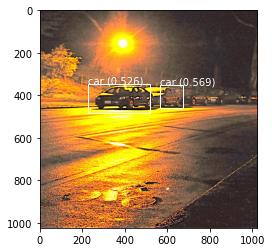

In [9]:
predict_objects(custom_config,model_2_weights,random_images[5])